# Week 5 assignemnt

The purpose of this assignment is to apply the art style of Monet to new photos. 

We are provided with original Monet paintings, around 300 of them. We are also provided with 7038 photos that we have to convert to a style that resemble Monet style painting. 

FOr this notebook, for full disclosure I will be using the architecture suggested by this notebook:

https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook

That being said. I will be making some tweaks to it and see what works well and what does not. So in the end we can give each model a look at the end. 

Github link: 

https://github.com/yiliu7724/Monet

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#import tensorflow_addons as tfa

#from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)


Number of replicas: 1
2.17.0


# Data loading and inspecting

I will be using the tfrec files given by the assignemnt for this project. FOr this part I am alrgely borrowing the code from the tutorial notebook. But i had to make a few modifications to the code for it to work on my computer. 

In [3]:
#GCS_PATH = KaggleDatasets().get_gcs_path()

MONET_FILENAMES = tf.io.gfile.glob(str('C:/Users/Johns/Desktop/Data/monet/monet_tfrec/*.tfrec'))
print('Monet TFRecord Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str('C:/Users/Johns/Desktop/Data/monet/photo_tfrec/*.tfrec'))
print('Photo TFRecord Files:', len(PHOTO_FILENAMES))

Monet TFRecord Files: 5
Photo TFRecord Files: 20


The images in this dataset are already RGB. so we have 3 channels. 

Let's load the datasets then. 

In [4]:
IMAGE_SIZE = [256, 256]
NO_CHANNELS = 3

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, NO_CHANNELS])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord)
    return dataset

monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(1)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(1)

# EDA: Visualize an example of picture and painting

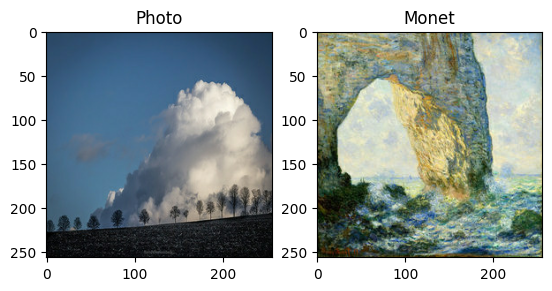

In [4]:
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

# Build the cycle GAN

The original notebook makes use of the architecture suggested by this paper:

https://arxiv.org/pdf/2203.02557

The UVCGAN architecture introduced in the paper makes use of an assumption of a shared and identical latent space. This is the same assumption as the other autoencoders and variational encoders we learned in class make.


For this project I am going to be making a few modifications to the original notebook architecture and experiment with changing the architecture around to see what works well.

I will not be able to make major modifications to the original structure in a weekly project of this type. However, I will be tweaking the model to see if certain hyperparameters for example improve the performance of the model. 

The architecture given here seems to have issues accomodating early stopping and other callbacks. So I will be eschewing them for this project. 

#### Note that the model is called cycle GAN because we are training 2 GANs at the same time. One transforms photo to Monet, and another transform Monet to photo. Because of this we actually have 2 GANS, and we can look at how well each of them perform. 

#### Because of that I will also make plots of Monet being transformed into photo as well as plots of photos being transformed to Monet and see how well each of these works. 

## Tuning covolution layer activation fuction

The original notebook makes use of instance normalization. But according to the paper on the architecture of this model batch normalization works as well. So for simplicity we can use batch normalization to see if it work well. 

### Trial 1: batch normalization with ReLU activation functions

The original notebook makes use of leaky ReLU activation. However, ReLU and PReLU will work as well. So I will begin by trying what happens if we use the ReLU activation function. 

In [6]:
OUTPUT_CHANNELS = 3

def downsample_batch_norm_ReLU(filters, size, apply_batch_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential([
        layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)
    ])

    if apply_batch_norm:
        result.add(layers.BatchNormalization())

    result.add(layers.ReLU())

    return result

def upsample_batch_norm_ReLU(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential([layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False), 
                              layers.BatchNormalization()])

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

def downsample_batch_norm_PReLU(filters, size, apply_batch_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential([
        layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False)
    ])

    if apply_batch_norm:
        result.add(layers.BatchNormalization())

    result.add(layers.PReLU(alpha_initializer='Zeros'))

    return result

def upsample_batch_norm_PReLU(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential([layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False), 
                              layers.BatchNormalization()])

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.PReLU(alpha_initializer='Zeros'))

    return result

In [6]:


def Generator_batch_norm_ReLU():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_ReLU(64, 4), # (bs, 128, 128, 64)
        downsample_batch_norm_ReLU(128, 4), # (bs, 64, 64, 128)
        downsample_batch_norm_ReLU(256, 4), # (bs, 32, 32, 256)
        downsample_batch_norm_ReLU(512, 4), # (bs, 16, 16, 512)
        downsample_batch_norm_ReLU(512, 4), # (bs, 8, 8, 512)
        downsample_batch_norm_ReLU(512, 4), # (bs, 4, 4, 512)
        downsample_batch_norm_ReLU(512, 4), # (bs, 2, 2, 512)
        downsample_batch_norm_ReLU(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_ReLU(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_ReLU(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_ReLU(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_ReLU(512, 4), # (bs, 16, 16, 1024)
        upsample_batch_norm_ReLU(256, 4), # (bs, 32, 32, 512)
        upsample_batch_norm_ReLU(128, 4), # (bs, 64, 64, 256)
        upsample_batch_norm_ReLU(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Generator_batch_norm_PReLU():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_PReLU(64, 4), # (bs, 128, 128, 64)
        downsample_batch_norm_PReLU(128, 4), # (bs, 64, 64, 128)
        downsample_batch_norm_PReLU(256, 4), # (bs, 32, 32, 256)
        downsample_batch_norm_PReLU(512, 4), # (bs, 16, 16, 512)
        downsample_batch_norm_PReLU(512, 4), # (bs, 8, 8, 512)
        downsample_batch_norm_PReLU(512, 4), # (bs, 4, 4, 512)
        downsample_batch_norm_PReLU(512, 4), # (bs, 2, 2, 512)
        downsample_batch_norm_PReLU(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_PReLU(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_PReLU(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_PReLU(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_PReLU(512, 4), # (bs, 16, 16, 1024)
        upsample_batch_norm_PReLU(256, 4), # (bs, 32, 32, 512)
        upsample_batch_norm_PReLU(128, 4), # (bs, 64, 64, 256)
        upsample_batch_norm_PReLU(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_batch_norm_PReLU():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_PReLU(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_PReLU(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_PReLU(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

def Discriminator_batch_norm_ReLU():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_ReLU(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_ReLU(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_ReLU(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_batch_norm_ReLU = Generator_batch_norm_ReLU()
    photo_generator_batch_norm_ReLU = Generator_batch_norm_ReLU()
    
    monet_generator_batch_norm_PReLU = Generator_batch_norm_PReLU()
    photo_generator_batch_norm_PReLU = Generator_batch_norm_PReLU()
    
    monet_discriminator_batch_norm_ReLU = Discriminator_batch_norm_ReLU()
    photo_discriminator_batch_norm_ReLU = Discriminator_batch_norm_ReLU()
    
    monet_discriminator_batch_norm_PReLU = Discriminator_batch_norm_PReLU()
    photo_discriminator_batch_norm_PReLU = Discriminator_batch_norm_PReLU()

class CycleGan_batch_norm_ReLU(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_ReLU,
        photo_generator_batch_norm_ReLU,
        monet_discriminator_batch_norm_ReLU,
        photo_discriminator_batch_norm_ReLU,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_ReLU, self).__init__()
        self.m_gen = monet_generator_batch_norm_ReLU
        self.p_gen = photo_generator_batch_norm_ReLU
        self.m_disc = monet_discriminator_batch_norm_ReLU
        self.p_disc = photo_discriminator_batch_norm_ReLU
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_ReLU, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_ReLU = CycleGan_batch_norm_ReLU(
        monet_generator_batch_norm_ReLU, photo_generator_batch_norm_ReLU, 
        monet_discriminator_batch_norm_ReLU, photo_discriminator_batch_norm_ReLU
    )

    cycle_gan_model_batch_norm_ReLU.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

    #callback = keras.callbacks.EarlyStopping(monitor='cycle_loss_fn',patience=3, restore_best_weights = True, start_from_epoch=0)
    
cycle_gan_model_batch_norm_ReLU_history = cycle_gan_model_batch_norm_ReLU.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 451s 1s/step - monet_disc_loss: 0.6783 - monet_gen_loss: 7.3234 - photo_disc_loss: 0.6592 - photo_gen_loss: 7.5646
Epoch 2/25


C:\Users\Johns\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


300/300 ━━━━━━━━━━━━━━━━━━━━ 445s 1s/step - monet_disc_loss: 0.6336 - monet_gen_loss: 6.6114 - photo_disc_loss: 0.6232 - photo_gen_loss: 6.7797
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 445s 1s/step - monet_disc_loss: 0.6396 - monet_gen_loss: 6.1592 - photo_disc_loss: 0.6431 - photo_gen_loss: 6.3277
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 439s 1s/step - monet_disc_loss: 0.6461 - monet_gen_loss: 5.8551 - photo_disc_loss: 0.6279 - photo_gen_loss: 6.0165
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 437s 1s/step - monet_disc_loss: 0.6430 - monet_gen_loss: 5.7335 - photo_disc_loss: 0.6176 - photo_gen_loss: 5.8792
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 436s 1s/step - monet_disc_loss: 0.6401 - monet_gen_loss: 5.6058 - photo_disc_loss: 0.6189 - photo_gen_loss: 5.7579
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 436s 1s/step - monet_disc_loss: 0.6362 - monet_gen_loss: 5.3987 - photo_disc_loss: 0.6168 - photo_gen_loss: 5.5163
Epoch 8/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 437s 1s/step - monet_disc_loss: 0.6291 - 

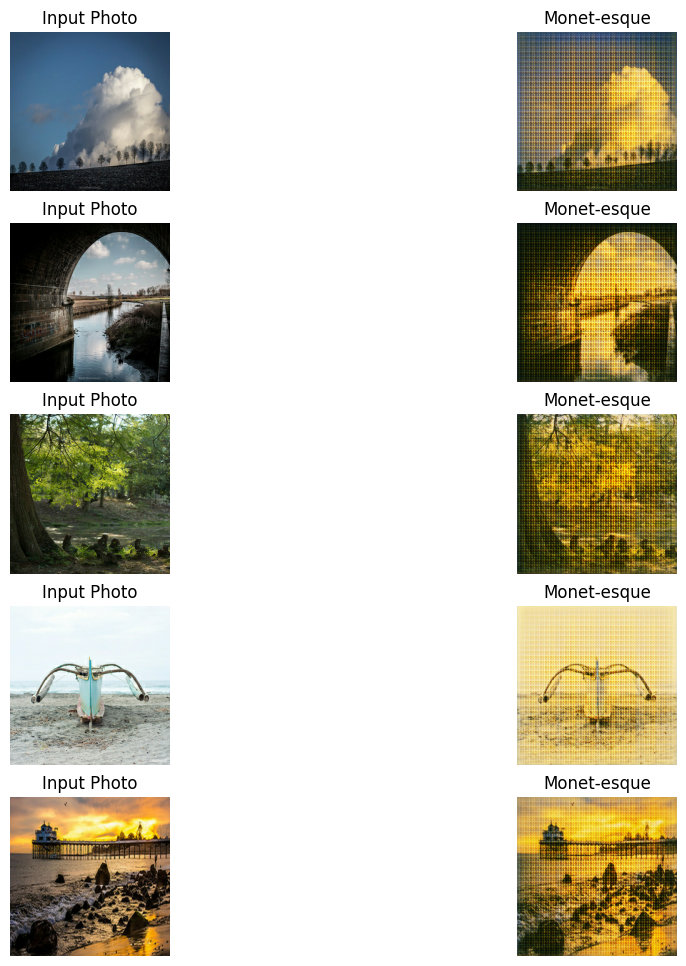

In [7]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_ReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

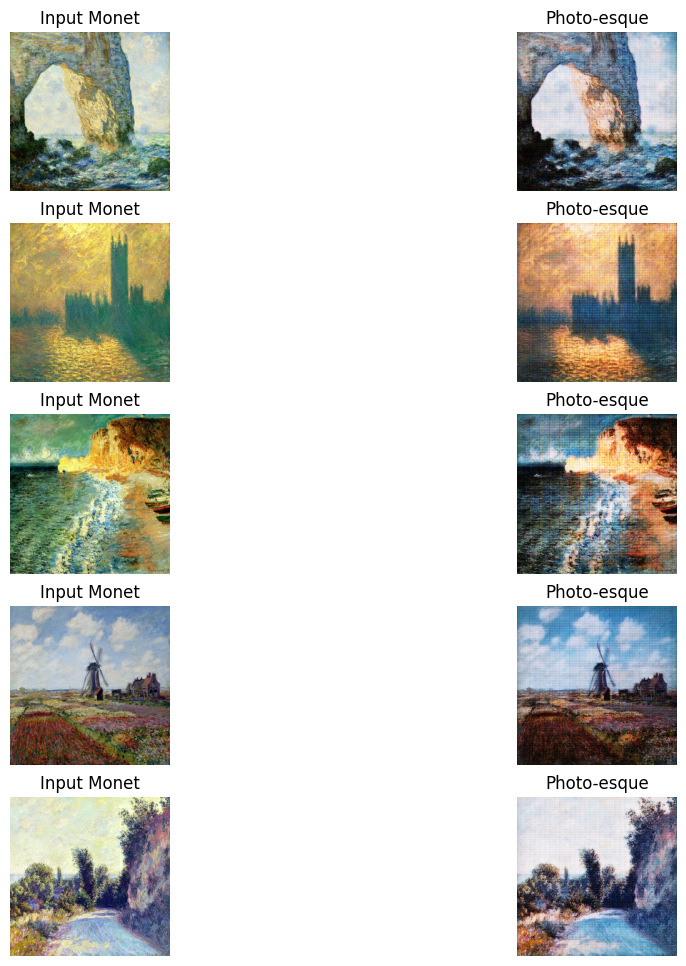

In [8]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_ReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

This isn't the best result. Let's try a different activation function. 

### Trial 2: Batch normalization with PReLU activation function

In [9]:

class CycleGan_batch_norm_PReLU(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_PReLU,
        photo_generator_batch_norm_PReLU,
        monet_discriminator_batch_norm_PReLU,
        photo_discriminator_batch_norm_PReLU,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_PReLU, self).__init__()
        self.m_gen = monet_generator_batch_norm_PReLU
        self.p_gen = photo_generator_batch_norm_PReLU
        self.m_disc = monet_discriminator_batch_norm_PReLU
        self.p_disc = photo_discriminator_batch_norm_PReLU
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_PReLU, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_PReLU = CycleGan_batch_norm_PReLU(
        monet_generator_batch_norm_PReLU, photo_generator_batch_norm_PReLU, 
        monet_discriminator_batch_norm_PReLU, photo_discriminator_batch_norm_PReLU
    )

    cycle_gan_model_batch_norm_PReLU.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

    #callback = keras.callbacks.EarlyStopping(monitor='cycle_loss_fn',patience=3, restore_best_weights = True, start_from_epoch=0)
    
cycle_gan_model_batch_norm_PReLU_history = cycle_gan_model_batch_norm_PReLU.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 453s 1s/step - monet_disc_loss: 0.6772 - monet_gen_loss: 7.3526 - photo_disc_loss: 0.6624 - photo_gen_loss: 7.5802
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 406s 1s/step - monet_disc_loss: 0.6289 - monet_gen_loss: 6.6285 - photo_disc_loss: 0.6366 - photo_gen_loss: 6.7922
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 410s 1s/step - monet_disc_loss: 0.6408 - monet_gen_loss: 6.1518 - photo_disc_loss: 0.6265 - photo_gen_loss: 6.3506
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 409s 1s/step - monet_disc_loss: 0.6431 - monet_gen_loss: 5.8123 - photo_disc_loss: 0.6184 - photo_gen_loss: 6.0139
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 407s 1s/step - monet_disc_loss: 0.6422 - monet_gen_loss: 5.6721 - photo_disc_loss: 0.6247 - photo_gen_loss: 5.8032
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 407s 1s/step - monet_disc_loss: 0.6410 - monet_gen_loss: 5.4210 - photo_disc_loss: 0.6130 - photo_gen_loss: 5.5686
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 414s 1s/step - monet_disc_loss

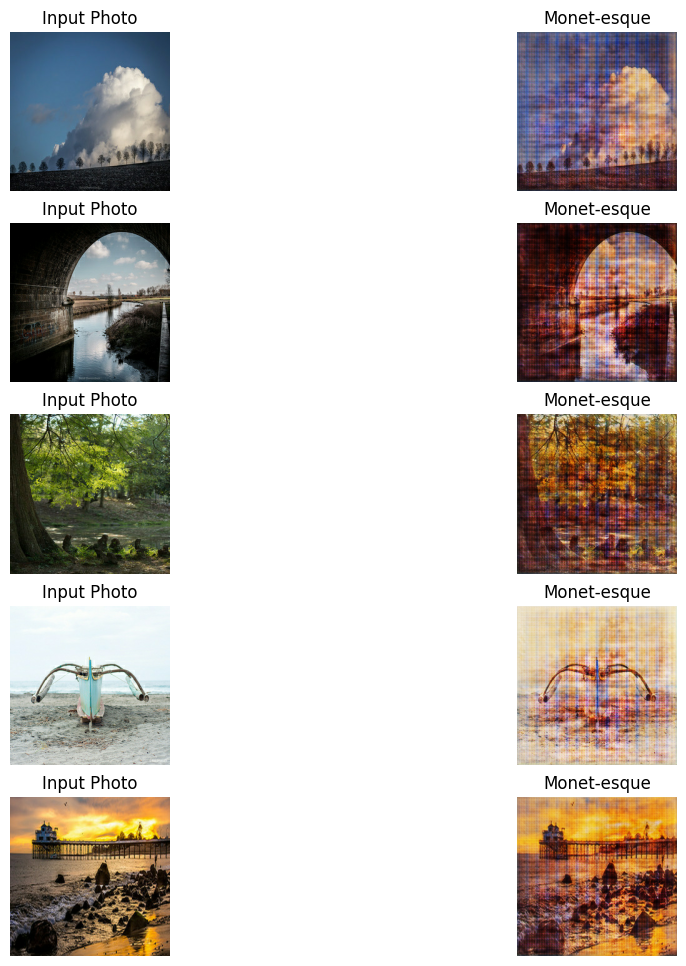

In [10]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_PReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

Using PReLU seems to create a generated image that has less clear grid like shape. 

Cool beans. For the subsequent tunings I will not be using PReLU activation function for model simplicity and ease of training. But I will keep this in mind.

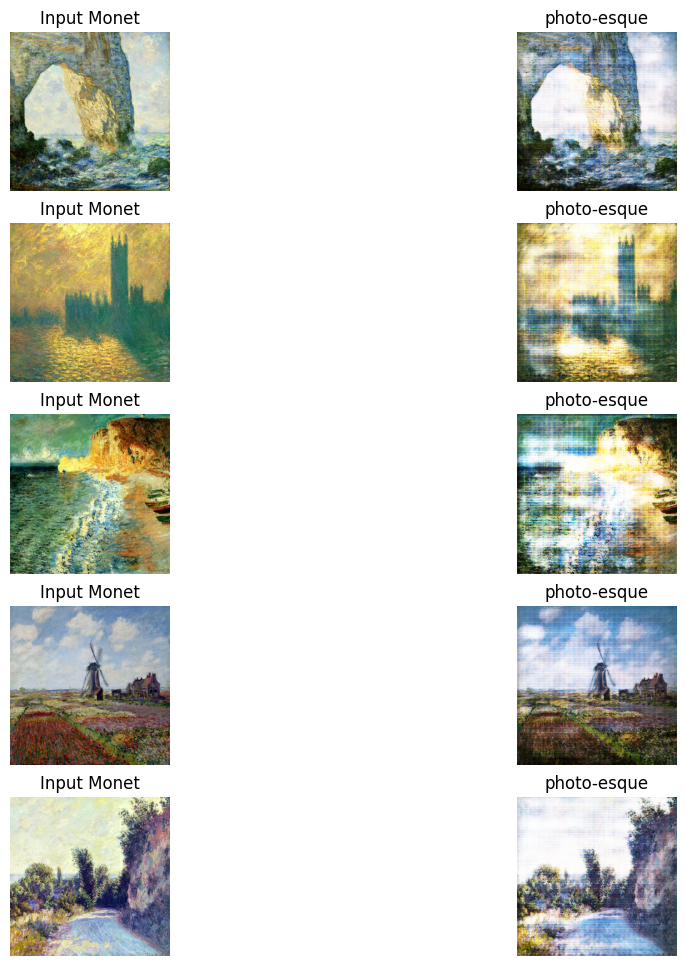

In [11]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_PReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

## Tuning regularization

### Trial 3: Eschew batch normalization and dropout

The original model in the tutorial called for instance normalization and dropout. Let’s create a model without normalization and dropout and see what happens with our model. 

In [12]:
def Generator_ReLU():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_ReLU(64, 4, apply_batch_norm = False), # (bs, 128, 128, 64)
        downsample_batch_norm_ReLU(128, 4, apply_batch_norm = False), # (bs, 64, 64, 128)
        downsample_batch_norm_ReLU(256, 4, apply_batch_norm = False), # (bs, 32, 32, 256)
        downsample_batch_norm_ReLU(512, 4, apply_batch_norm = False), # (bs, 16, 16, 512)
        downsample_batch_norm_ReLU(512, 4, apply_batch_norm = False), # (bs, 8, 8, 512)
        downsample_batch_norm_ReLU(512, 4, apply_batch_norm = False), # (bs, 4, 4, 512)
        downsample_batch_norm_ReLU(512, 4, apply_batch_norm = False), # (bs, 2, 2, 512)
        downsample_batch_norm_ReLU(512, 4, apply_batch_norm = False), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_ReLU(512, 4), # (bs, 2, 2, 1024)
        upsample_batch_norm_ReLU(512, 4), # (bs, 4, 4, 1024)
        upsample_batch_norm_ReLU(512, 4), # (bs, 8, 8, 1024)
        upsample_batch_norm_ReLU(512, 4), # (bs, 16, 16, 1024)
        upsample_batch_norm_ReLU(256, 4), # (bs, 32, 32, 512)
        upsample_batch_norm_ReLU(128, 4), # (bs, 64, 64, 256)
        upsample_batch_norm_ReLU(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_ReLU():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_ReLU(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_ReLU(128, 4, False)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_ReLU(256, 4, False)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    #norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(conv)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_ReLU = Generator_ReLU()
    photo_generator_ReLU = Generator_ReLU()
    
    monet_discriminator_ReLU = Discriminator_ReLU()
    photo_discriminator_ReLU = Discriminator_ReLU()
    
class CycleGan_ReLU(keras.Model):
    def __init__(
        self,
        monet_generator_ReLU,
        photo_generator_ReLU,
        monet_discriminator_ReLU,
        photo_discriminator_ReLU,
        lambda_cycle=10,
    ):
        super(CycleGan_ReLU, self).__init__()
        self.m_gen = monet_generator_ReLU
        self.p_gen = photo_generator_ReLU
        self.m_disc = monet_discriminator_ReLU
        self.p_disc = photo_discriminator_ReLU
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_ReLU, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_ReLU = CycleGan_ReLU(
        monet_generator_ReLU, photo_generator_ReLU, 
        monet_discriminator_ReLU, photo_discriminator_ReLU
    )

    cycle_gan_model_ReLU.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

    #callback = keras.callbacks.EarlyStopping(monitor='cycle_loss_fn',patience=3, restore_best_weights = True, start_from_epoch=0)
    
cycle_gan_model_ReLU_history = cycle_gan_model_ReLU.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs = 25
)

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 399s 1s/step - monet_disc_loss: 0.6772 - monet_gen_loss: 6.4076 - photo_disc_loss: 0.6359 - photo_gen_loss: 6.5587
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 392s 1s/step - monet_disc_loss: 0.6622 - monet_gen_loss: 3.9965 - photo_disc_loss: 0.6701 - photo_gen_loss: 3.8978
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 394s 1s/step - monet_disc_loss: 0.6577 - monet_gen_loss: 3.7493 - photo_disc_loss: 0.6530 - photo_gen_loss: 3.5674
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 387s 1s/step - monet_disc_loss: 0.6267 - monet_gen_loss: 3.6922 - photo_disc_loss: 0.6515 - photo_gen_loss: 3.4903
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 373s 1s/step - monet_disc_loss: 0.6374 - monet_gen_loss: 3.5634 - photo_disc_loss: 0.6491 - photo_gen_loss: 3.3705
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 392s 1s/step - monet_disc_loss: 0.6236 - monet_gen_loss: 3.3888 - photo_disc_loss: 0.6436 - photo_gen_loss: 3.2002
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 388s 1s/step - monet_disc_loss

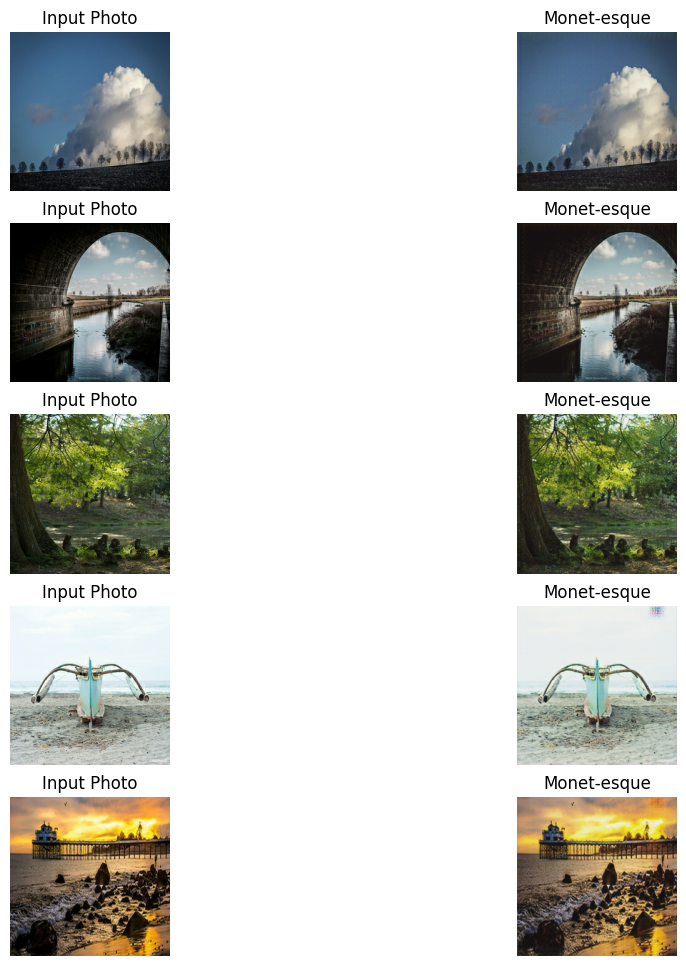

In [13]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_ReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

The monet here looks too much like the original photo. So this is actually not desirable as well. 

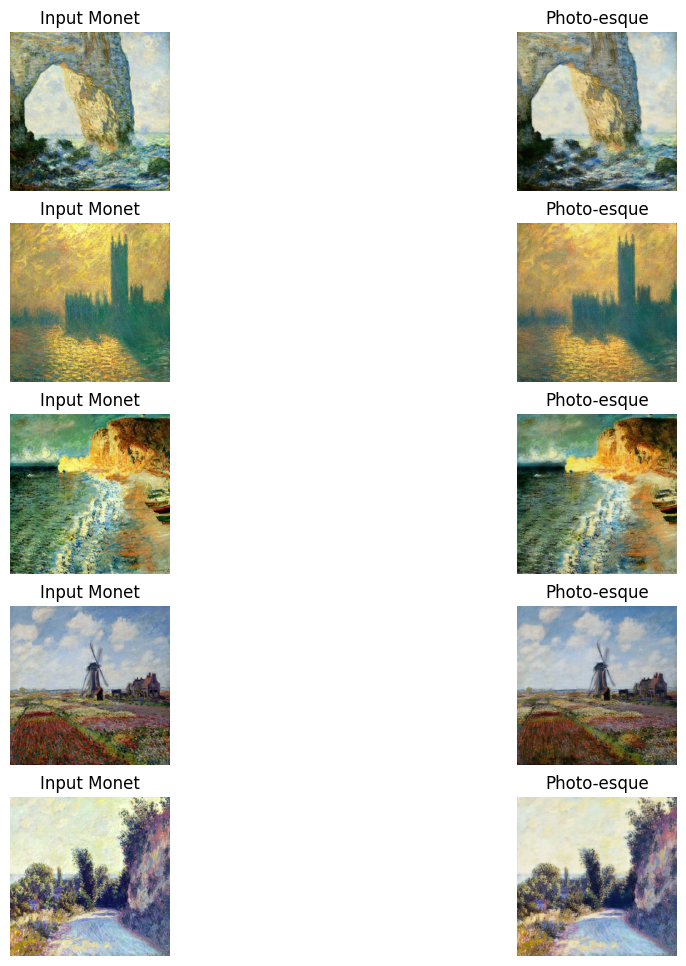

In [14]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_ReLU(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

We can see here that the reverse is just as bad, as nothing changes. 

## Tuning filter sizes and padding sizes

The original tutorial notebook had a filter size per layer of 4 and uses padding. 

For these tweaking, to make sure our latent space remains the same size and that our number of layers stay the same I will continue to use padding. 

But I can change the filter size to see if and how things change here. 

### Trial 4: Filter size 5

In [15]:
def Generator_batch_norm_ReLU_filter_size_5():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_ReLU(64, 5), # (bs, 128, 128, 64)
        downsample_batch_norm_ReLU(128, 5), # (bs, 64, 64, 128)
        downsample_batch_norm_ReLU(256, 5), # (bs, 32, 32, 256)
        downsample_batch_norm_ReLU(512, 5), # (bs, 16, 16, 512)
        downsample_batch_norm_ReLU(512, 5), # (bs, 8, 8, 512)
        downsample_batch_norm_ReLU(512, 5), # (bs, 4, 4, 512)
        downsample_batch_norm_ReLU(512, 5), # (bs, 2, 2, 512)
        downsample_batch_norm_ReLU(512, 5), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_ReLU(512, 5, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_ReLU(512, 5, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_ReLU(512, 5, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_ReLU(512, 5), # (bs, 16, 16, 1024)
        upsample_batch_norm_ReLU(256, 5), # (bs, 32, 32, 512)
        upsample_batch_norm_ReLU(128, 5), # (bs, 64, 64, 256)
        upsample_batch_norm_ReLU(64, 5), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)


    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_batch_norm_ReLU_filter_size_5():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_ReLU(64, 7, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_ReLU(128, 7)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_ReLU(256, 7)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_batch_norm_ReLU_filter_size_5 = Generator_batch_norm_ReLU_filter_size_5()
    photo_generator_batch_norm_ReLU_filter_size_5 = Generator_batch_norm_ReLU_filter_size_5()
    
    monet_discriminator_batch_norm_ReLU_filter_size_5 = Discriminator_batch_norm_ReLU_filter_size_5()
    photo_discriminator_batch_norm_ReLU_filter_size_5 = Discriminator_batch_norm_ReLU_filter_size_5()

class CycleGan_batch_norm_ReLU_filter_size_5(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_ReLU_filter_size_5,
        photo_generator_batch_norm_ReLU_filter_size_5,
        monet_discriminator_batch_norm_ReLU_filter_size_5,
        photo_discriminator_batch_norm_ReLU_filter_size_5,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_5, self).__init__()
        self.m_gen = monet_generator_batch_norm_ReLU_filter_size_5
        self.p_gen = photo_generator_batch_norm_ReLU_filter_size_5
        self.m_disc = monet_discriminator_batch_norm_ReLU_filter_size_5
        self.p_disc = photo_discriminator_batch_norm_ReLU_filter_size_5
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_5, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_ReLU_filter_size_5 = CycleGan_batch_norm_ReLU_filter_size_5(
        monet_generator_batch_norm_ReLU_filter_size_5, photo_generator_batch_norm_ReLU_filter_size_5, 
        monet_discriminator_batch_norm_ReLU_filter_size_5, photo_discriminator_batch_norm_ReLU_filter_size_5
    )

    cycle_gan_model_batch_norm_ReLU_filter_size_5.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

    #callback = keras.callbacks.EarlyStopping(monitor='cycle_loss_fn',patience=3, restore_best_weights = True, start_from_epoch=0)
    
cycle_gan_model_batch_norm_ReLU_filter_size_5_history = cycle_gan_model_batch_norm_ReLU_filter_size_5.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 643s 2s/step - monet_disc_loss: 0.6798 - monet_gen_loss: 7.3578 - photo_disc_loss: 0.6538 - photo_gen_loss: 7.5950
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 633s 2s/step - monet_disc_loss: 0.6314 - monet_gen_loss: 6.8061 - photo_disc_loss: 0.6381 - photo_gen_loss: 6.9692
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 646s 2s/step - monet_disc_loss: 0.6476 - monet_gen_loss: 6.3359 - photo_disc_loss: 0.6280 - photo_gen_loss: 6.5605
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 672s 2s/step - monet_disc_loss: 0.6386 - monet_gen_loss: 6.0113 - photo_disc_loss: 0.6354 - photo_gen_loss: 6.2081
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 672s 2s/step - monet_disc_loss: 0.6503 - monet_gen_loss: 5.8542 - photo_disc_loss: 0.6396 - photo_gen_loss: 5.9449
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 668s 2s/step - monet_disc_loss: 0.6365 - monet_gen_loss: 5.8431 - photo_disc_loss: 0.6312 - photo_gen_loss: 5.9978
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 664s 2s/step - monet_disc_loss

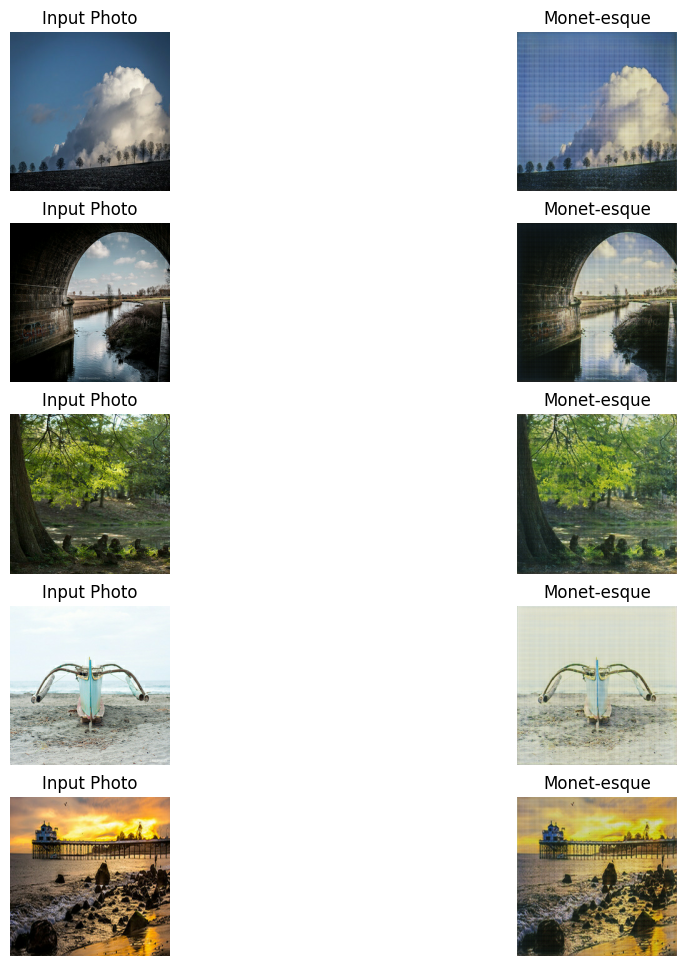

In [16]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_ReLU_filter_size_5(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

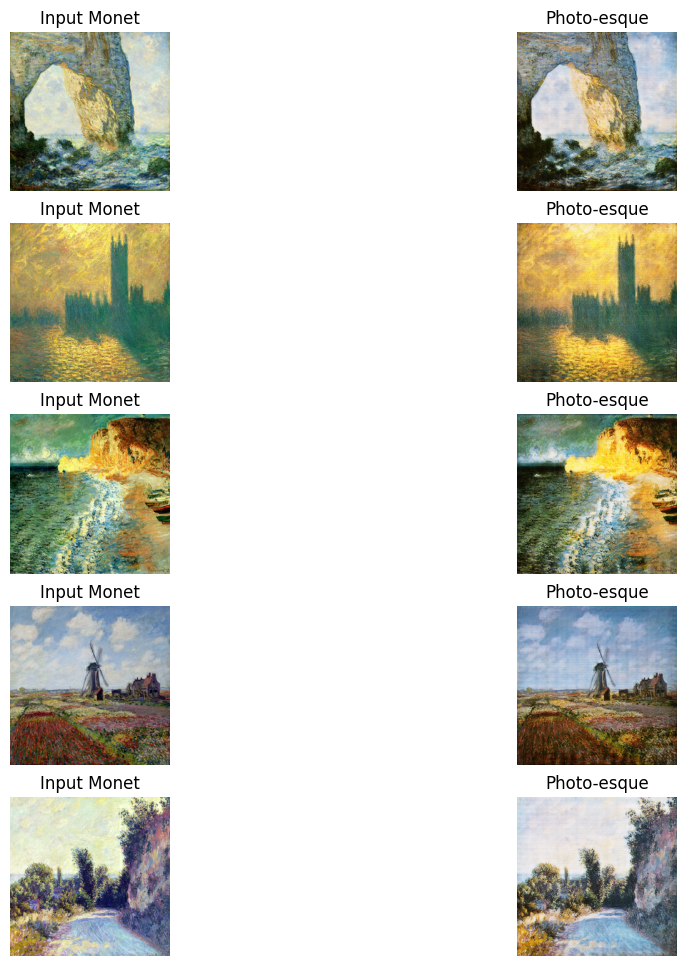

In [17]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_ReLU_filter_size_5(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

### Trial 5: Filter size 3

In [18]:
def Generator_batch_norm_ReLU_filter_size_3():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_ReLU(64, 3), # (bs, 128, 128, 64)
        downsample_batch_norm_ReLU(128, 3), # (bs, 64, 64, 128)
        downsample_batch_norm_ReLU(256, 3), # (bs, 32, 32, 256)
        downsample_batch_norm_ReLU(512, 3), # (bs, 16, 16, 512)
        downsample_batch_norm_ReLU(512, 3), # (bs, 8, 8, 512)
        downsample_batch_norm_ReLU(512, 3), # (bs, 4, 4, 512)
        downsample_batch_norm_ReLU(512, 3), # (bs, 2, 2, 512)
        downsample_batch_norm_ReLU(512, 3), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_ReLU(512, 3, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_ReLU(512, 3, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_ReLU(512, 3, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_ReLU(512, 3), # (bs, 16, 16, 1024)
        upsample_batch_norm_ReLU(256, 3), # (bs, 32, 32, 512)
        upsample_batch_norm_ReLU(128, 3), # (bs, 64, 64, 256)
        upsample_batch_norm_ReLU(64, 3), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)


    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_batch_norm_ReLU_filter_size_3():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_ReLU(64, 3, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_ReLU(128, 3)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_ReLU(256, 3)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_batch_norm_ReLU_filter_size_3 = Generator_batch_norm_ReLU_filter_size_3()
    photo_generator_batch_norm_ReLU_filter_size_3 = Generator_batch_norm_ReLU_filter_size_3()
    
    monet_discriminator_batch_norm_ReLU_filter_size_3 = Discriminator_batch_norm_ReLU_filter_size_3()
    photo_discriminator_batch_norm_ReLU_filter_size_3 = Discriminator_batch_norm_ReLU_filter_size_3()

class CycleGan_batch_norm_ReLU_filter_size_3(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_ReLU_filter_size_3,
        photo_generator_batch_norm_ReLU_filter_size_3,
        monet_discriminator_batch_norm_ReLU_filter_size_3,
        photo_discriminator_batch_norm_ReLU_filter_size_3,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_3, self).__init__()
        self.m_gen = monet_generator_batch_norm_ReLU_filter_size_3
        self.p_gen = photo_generator_batch_norm_ReLU_filter_size_3
        self.m_disc = monet_discriminator_batch_norm_ReLU_filter_size_3
        self.p_disc = photo_discriminator_batch_norm_ReLU_filter_size_3
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_3, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_ReLU_filter_size_3 = CycleGan_batch_norm_ReLU_filter_size_3(
        monet_generator_batch_norm_ReLU_filter_size_3, photo_generator_batch_norm_ReLU_filter_size_3, 
        monet_discriminator_batch_norm_ReLU_filter_size_3, photo_discriminator_batch_norm_ReLU_filter_size_3
    )

    cycle_gan_model_batch_norm_ReLU_filter_size_3.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

   # callback = tf.keras.callbacks.EarlyStopping(monitor='monet_gen_loss',patience=3, restore_best_weights = True, start_from_epoch=0, mode='min')
    
cycle_gan_model_batch_norm_ReLU_filter_size_3_history = cycle_gan_model_batch_norm_ReLU_filter_size_3.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=15#, callbacks = [callback]
)

Epoch 1/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 289s 844ms/step - monet_disc_loss: 0.6839 - monet_gen_loss: 7.2701 - photo_disc_loss: 0.6743 - photo_gen_loss: 7.4676
Epoch 2/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 304s 1s/step - monet_disc_loss: 0.6449 - monet_gen_loss: 6.4405 - photo_disc_loss: 0.6294 - photo_gen_loss: 6.6349
Epoch 3/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 307s 1s/step - monet_disc_loss: 0.6446 - monet_gen_loss: 6.0076 - photo_disc_loss: 0.6230 - photo_gen_loss: 6.1897
Epoch 4/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 306s 1s/step - monet_disc_loss: 0.6512 - monet_gen_loss: 5.6512 - photo_disc_loss: 0.6193 - photo_gen_loss: 5.8009
Epoch 5/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 305s 1s/step - monet_disc_loss: 0.6392 - monet_gen_loss: 5.4260 - photo_disc_loss: 0.6324 - photo_gen_loss: 5.4706
Epoch 6/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 307s 1s/step - monet_disc_loss: 0.6275 - monet_gen_loss: 5.2216 - photo_disc_loss: 0.6034 - photo_gen_loss: 5.2743
Epoch 7/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 307s 1s/step - monet_disc_l

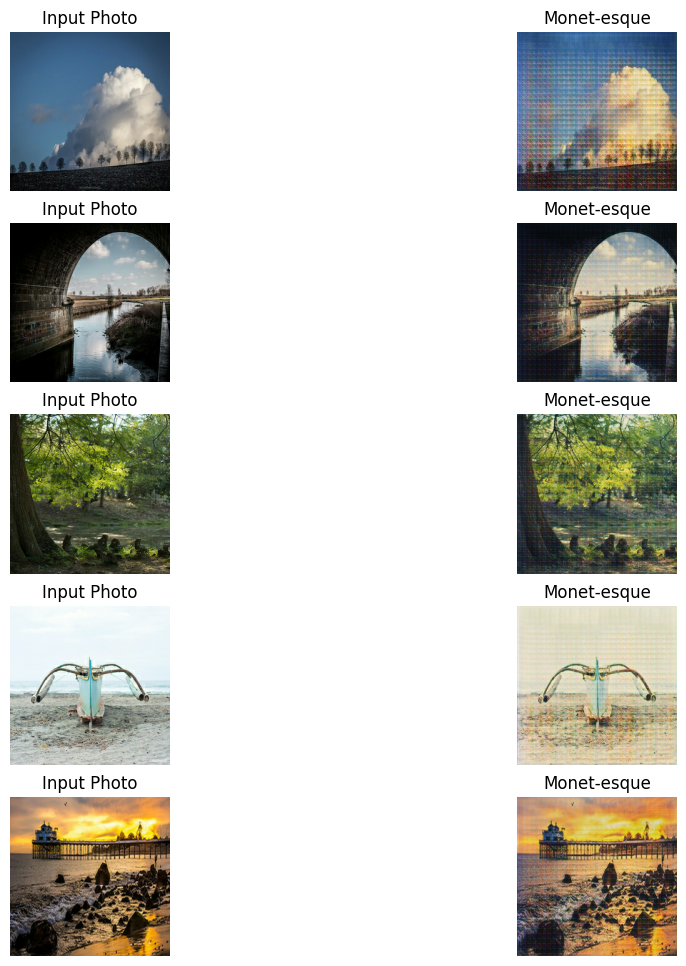

In [19]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_ReLU_filter_size_3(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

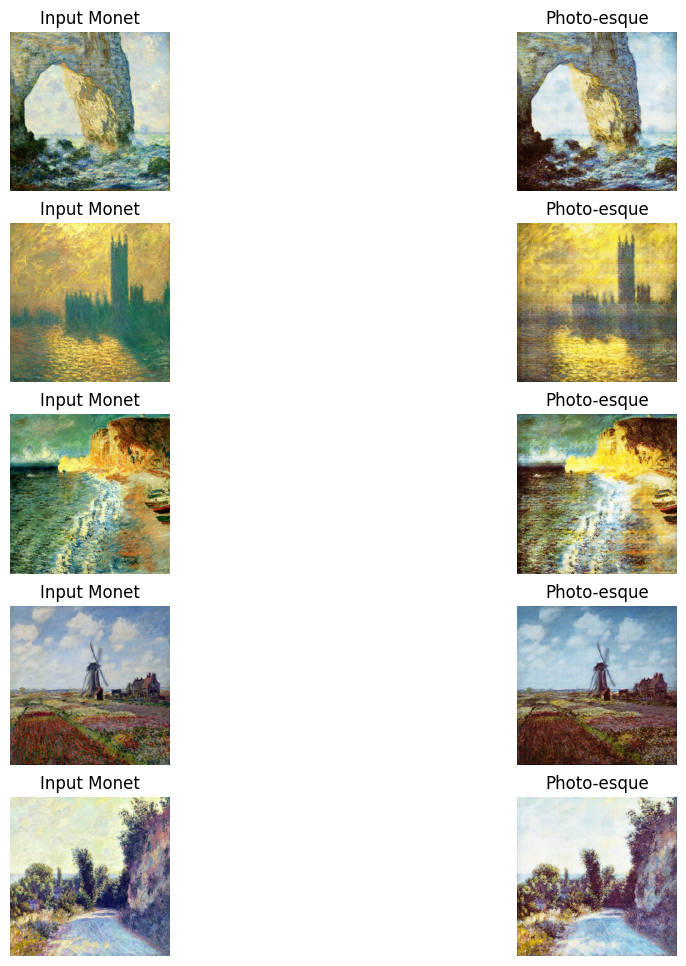

In [20]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_ReLU_filter_size_3(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

### Trial 6, filter size of 6

In [21]:
def Generator_batch_norm_ReLU_filter_size_6():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_ReLU(64, 6), # (bs, 128, 128, 64)
        downsample_batch_norm_ReLU(128, 6), # (bs, 64, 64, 128)
        downsample_batch_norm_ReLU(256, 6), # (bs, 32, 32, 256)
        downsample_batch_norm_ReLU(512, 6), # (bs, 16, 16, 512)
        downsample_batch_norm_ReLU(512, 6), # (bs, 8, 8, 512)
        downsample_batch_norm_ReLU(512, 6), # (bs, 4, 4, 512)
        downsample_batch_norm_ReLU(512, 6), # (bs, 2, 2, 512)
        downsample_batch_norm_ReLU(512, 6), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_ReLU(512, 6, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_ReLU(512, 6, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_ReLU(512, 6, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_ReLU(512, 6), # (bs, 16, 16, 1024)
        upsample_batch_norm_ReLU(256, 6), # (bs, 32, 32, 512)
        upsample_batch_norm_ReLU(128, 6), # (bs, 64, 64, 256)
        upsample_batch_norm_ReLU(64, 6), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)


    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_batch_norm_ReLU_filter_size_6():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_ReLU(64, 6, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_ReLU(128, 6)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_ReLU(256, 6)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.ReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_batch_norm_ReLU_filter_size_6 = Generator_batch_norm_ReLU_filter_size_6()
    photo_generator_batch_norm_ReLU_filter_size_6 = Generator_batch_norm_ReLU_filter_size_6()
    
    monet_discriminator_batch_norm_ReLU_filter_size_6 = Discriminator_batch_norm_ReLU_filter_size_6()
    photo_discriminator_batch_norm_ReLU_filter_size_6 = Discriminator_batch_norm_ReLU_filter_size_6()

class CycleGan_batch_norm_ReLU_filter_size_6(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_ReLU_filter_size_6,
        photo_generator_batch_norm_ReLU_filter_size_6,
        monet_discriminator_batch_norm_ReLU_filter_size_6,
        photo_discriminator_batch_norm_ReLU_filter_size_6,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_6, self).__init__()
        self.m_gen = monet_generator_batch_norm_ReLU_filter_size_6
        self.p_gen = photo_generator_batch_norm_ReLU_filter_size_6
        self.m_disc = monet_discriminator_batch_norm_ReLU_filter_size_6
        self.p_disc = photo_discriminator_batch_norm_ReLU_filter_size_6
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_ReLU_filter_size_6, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_ReLU_filter_size_6 = CycleGan_batch_norm_ReLU_filter_size_6(
        monet_generator_batch_norm_ReLU_filter_size_6, photo_generator_batch_norm_ReLU_filter_size_6, 
        monet_discriminator_batch_norm_ReLU_filter_size_6, photo_discriminator_batch_norm_ReLU_filter_size_6
    )

    cycle_gan_model_batch_norm_ReLU_filter_size_6.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

    #callback = keras.callbacks.EarlyStopping(monitor='cycle_loss_fn',patience=3, restore_best_weights = True, start_from_epoch=0)
    
cycle_gan_model_batch_norm_ReLU_filter_size_6_history = cycle_gan_model_batch_norm_ReLU_filter_size_6.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

Epoch 1/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 862s 3s/step - monet_disc_loss: 0.6555 - monet_gen_loss: 7.5835 - photo_disc_loss: 0.6444 - photo_gen_loss: 7.7896
Epoch 2/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 844s 3s/step - monet_disc_loss: 0.6353 - monet_gen_loss: 6.9521 - photo_disc_loss: 0.6463 - photo_gen_loss: 7.1053
Epoch 3/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 845s 3s/step - monet_disc_loss: 0.6351 - monet_gen_loss: 6.5557 - photo_disc_loss: 0.6362 - photo_gen_loss: 6.7364
Epoch 4/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 847s 3s/step - monet_disc_loss: 0.6452 - monet_gen_loss: 6.2093 - photo_disc_loss: 0.6398 - photo_gen_loss: 6.3759
Epoch 5/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 854s 3s/step - monet_disc_loss: 0.6508 - monet_gen_loss: 6.0367 - photo_disc_loss: 0.6445 - photo_gen_loss: 6.2668
Epoch 6/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 850s 3s/step - monet_disc_loss: 0.6498 - monet_gen_loss: 5.8932 - photo_disc_loss: 0.6517 - photo_gen_loss: 5.9223
Epoch 7/25
300/300 ━━━━━━━━━━━━━━━━━━━━ 858s 3s/step - monet_disc_loss

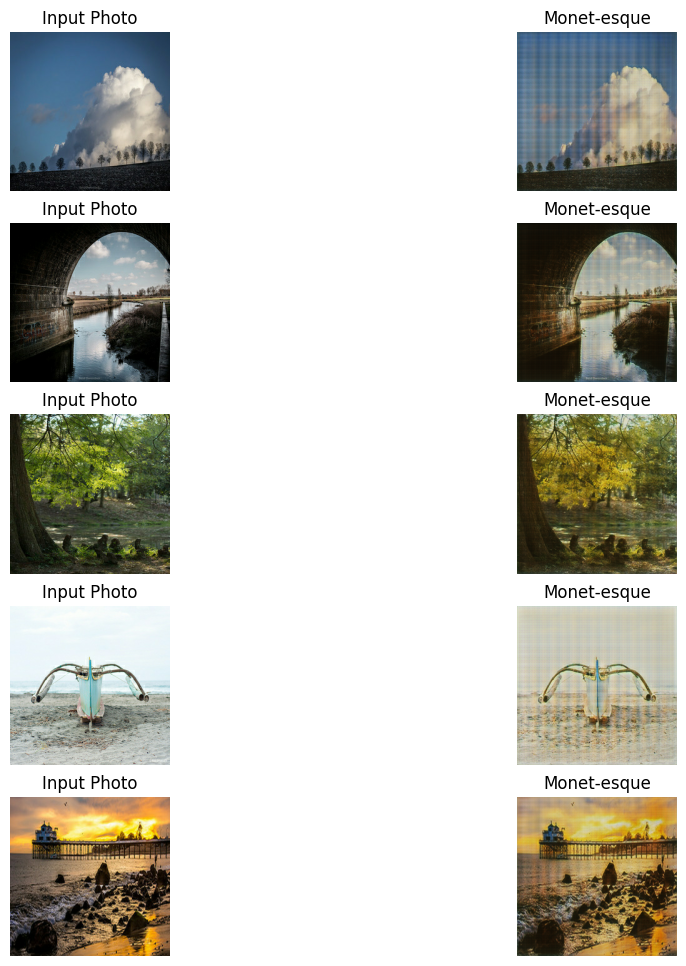

In [22]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_ReLU_filter_size_6(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

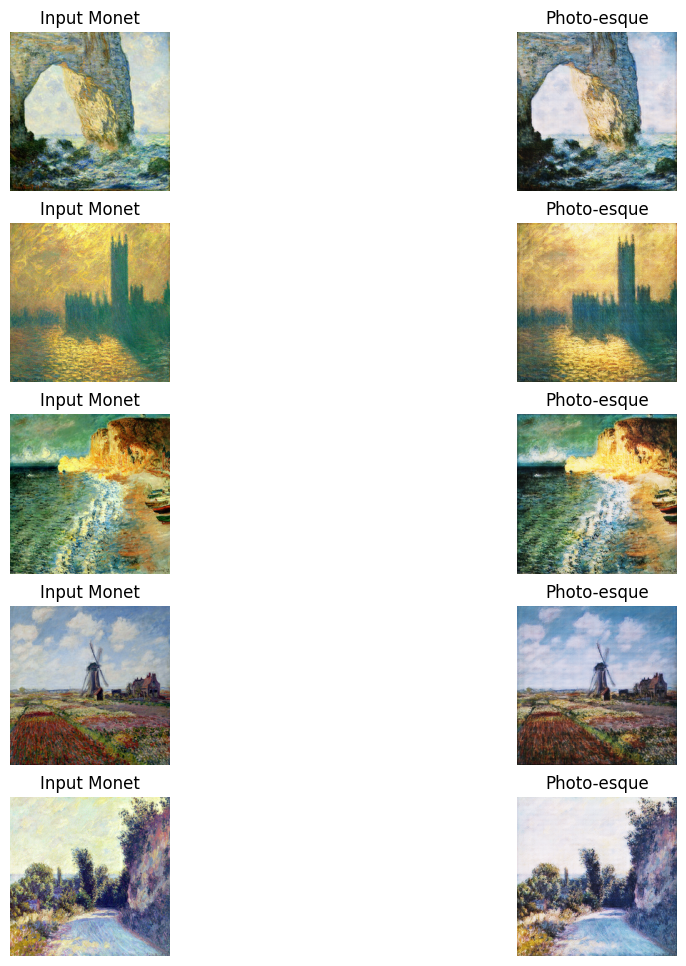

In [23]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_ReLU_filter_size_6(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

# Conclusions and discussions

1. Using PReLU rather than ReLU helps with making the generated colors better.

2. Using larger filter sizes seem to work well. Using even number sized filters seems to eliminate the grains in the generated images more.

3. Regularization is necessary for the model to actually change the images. Not using regularization results in images that arn't really transformed.

4. The cycle GAN model seems better at matching colors that are Monet style than at matching shapes and brush strokes. The resulting pictures do take on the color scheme that resemble a painting, but don't yet have the texture and stuff of a painting.

5. THe results between different trials is a bit unstable. The way the images looks each time i run this notebook is different.  

6. This points to a likely best model that uses regularization, has filter size of 6, uses PReLU. So let's create a final model with these: 

# Fitting final model and submission

In [7]:
def Generator_batch_norm_PReLU_filter_size_6():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample_batch_norm_PReLU(64, 6), # (bs, 128, 128, 64)
        downsample_batch_norm_PReLU(128, 6), # (bs, 64, 64, 128)
        downsample_batch_norm_PReLU(256, 6), # (bs, 32, 32, 256)
        downsample_batch_norm_PReLU(512, 6), # (bs, 16, 16, 512)
        downsample_batch_norm_PReLU(512, 6), # (bs, 8, 8, 512)
        downsample_batch_norm_PReLU(512, 6), # (bs, 4, 4, 512)
        downsample_batch_norm_PReLU(512, 6), # (bs, 2, 2, 512)
        downsample_batch_norm_PReLU(512, 6), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample_batch_norm_PReLU(512, 6, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample_batch_norm_PReLU(512, 6, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample_batch_norm_PReLU(512, 6, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample_batch_norm_PReLU(512, 6), # (bs, 16, 16, 1024)
        upsample_batch_norm_PReLU(256, 6), # (bs, 32, 32, 512)
        upsample_batch_norm_PReLU(128, 6), # (bs, 64, 64, 256)
        upsample_batch_norm_PReLU(64, 6), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)


    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator_batch_norm_PReLU_filter_size_6():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample_batch_norm_PReLU(64, 3, False)(x) # (bs, 128, 128, 64)
    down2 = downsample_batch_norm_PReLU(128, 3)(down1) # (bs, 64, 64, 128)
    down3 = downsample_batch_norm_PReLU(256, 3)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = layers.BatchNormalization()(conv)

    leaky_relu = layers.PReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator_batch_norm_PReLU_filter_size_6 = Generator_batch_norm_PReLU_filter_size_6()
    photo_generator_batch_norm_PReLU_filter_size_6 = Generator_batch_norm_PReLU_filter_size_6()
    
    monet_discriminator_batch_norm_PReLU_filter_size_6 = Discriminator_batch_norm_PReLU_filter_size_6()
    photo_discriminator_batch_norm_PReLU_filter_size_6 = Discriminator_batch_norm_PReLU_filter_size_6()

class CycleGan_batch_norm_PReLU_filter_size_6(keras.Model):
    def __init__(
        self,
        monet_generator_batch_norm_PReLU_filter_size_6,
        photo_generator_batch_norm_PReLU_filter_size_6,
        monet_discriminator_batch_norm_PReLU_filter_size_6,
        photo_discriminator_batch_norm_PReLU_filter_size_6,
        lambda_cycle=10,
    ):
        super(CycleGan_batch_norm_PReLU_filter_size_6, self).__init__()
        self.m_gen = monet_generator_batch_norm_PReLU_filter_size_6
        self.p_gen = photo_generator_batch_norm_PReLU_filter_size_6
        self.m_disc = monet_discriminator_batch_norm_PReLU_filter_size_6
        self.p_disc = photo_discriminator_batch_norm_PReLU_filter_size_6
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan_batch_norm_PReLU_filter_size_6, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4)

with strategy.scope():
    cycle_gan_model_batch_norm_PReLU_filter_size_6 = CycleGan_batch_norm_PReLU_filter_size_6(
        monet_generator_batch_norm_PReLU_filter_size_6, photo_generator_batch_norm_PReLU_filter_size_6, 
        monet_discriminator_batch_norm_PReLU_filter_size_6, photo_discriminator_batch_norm_PReLU_filter_size_6
    )

    cycle_gan_model_batch_norm_PReLU_filter_size_6.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

cycle_gan_model_batch_norm_PReLU_filter_size_6_history = cycle_gan_model_batch_norm_PReLU_filter_size_6.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=20
)

Epoch 1/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 785s 2s/step - monet_disc_loss: 0.6745 - monet_gen_loss: 7.4672 - photo_disc_loss: 0.6592 - photo_gen_loss: 7.6910
Epoch 2/20


C:\Users\Johns\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


300/300 ━━━━━━━━━━━━━━━━━━━━ 748s 2s/step - monet_disc_loss: 0.6342 - monet_gen_loss: 6.8902 - photo_disc_loss: 0.6277 - photo_gen_loss: 7.0959
Epoch 3/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 739s 2s/step - monet_disc_loss: 0.6404 - monet_gen_loss: 6.4600 - photo_disc_loss: 0.6316 - photo_gen_loss: 6.6913
Epoch 4/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 734s 2s/step - monet_disc_loss: 0.6453 - monet_gen_loss: 6.1242 - photo_disc_loss: 0.6302 - photo_gen_loss: 6.3721
Epoch 5/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 742s 2s/step - monet_disc_loss: 0.6457 - monet_gen_loss: 5.9385 - photo_disc_loss: 0.6282 - photo_gen_loss: 6.1342
Epoch 6/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 734s 2s/step - monet_disc_loss: 0.6400 - monet_gen_loss: 5.8672 - photo_disc_loss: 0.6217 - photo_gen_loss: 6.0785
Epoch 7/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 725s 2s/step - monet_disc_loss: 0.6328 - monet_gen_loss: 5.7616 - photo_disc_loss: 0.6285 - photo_gen_loss: 5.9388
Epoch 8/20
300/300 ━━━━━━━━━━━━━━━━━━━━ 730s 2s/step - monet_disc_loss: 0.6337 - 

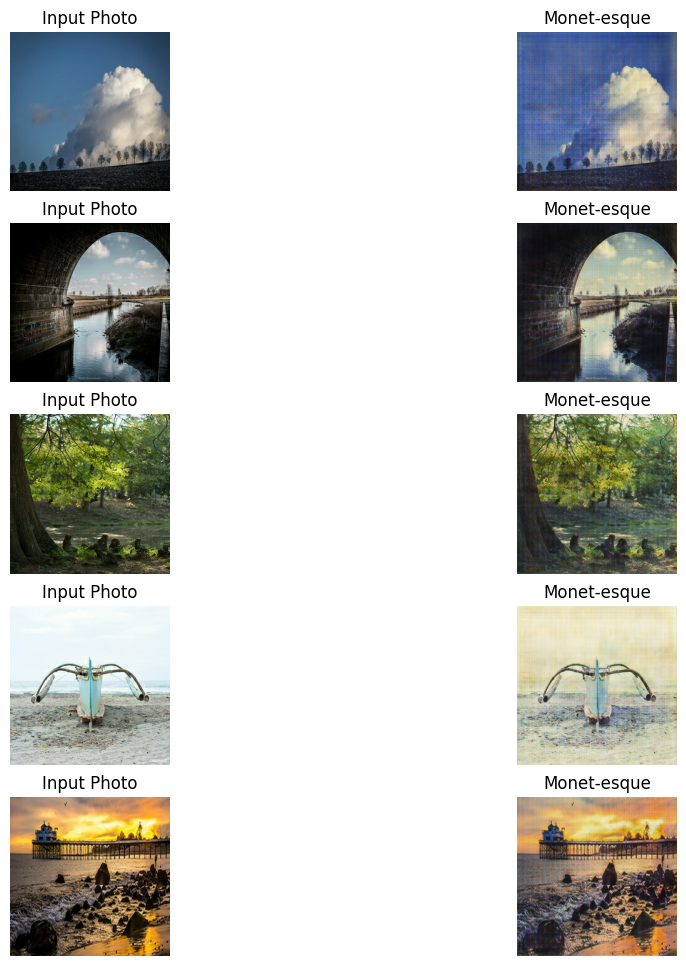

In [8]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(photo_ds.take(5)):
    prediction = monet_generator_batch_norm_PReLU_filter_size_6(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

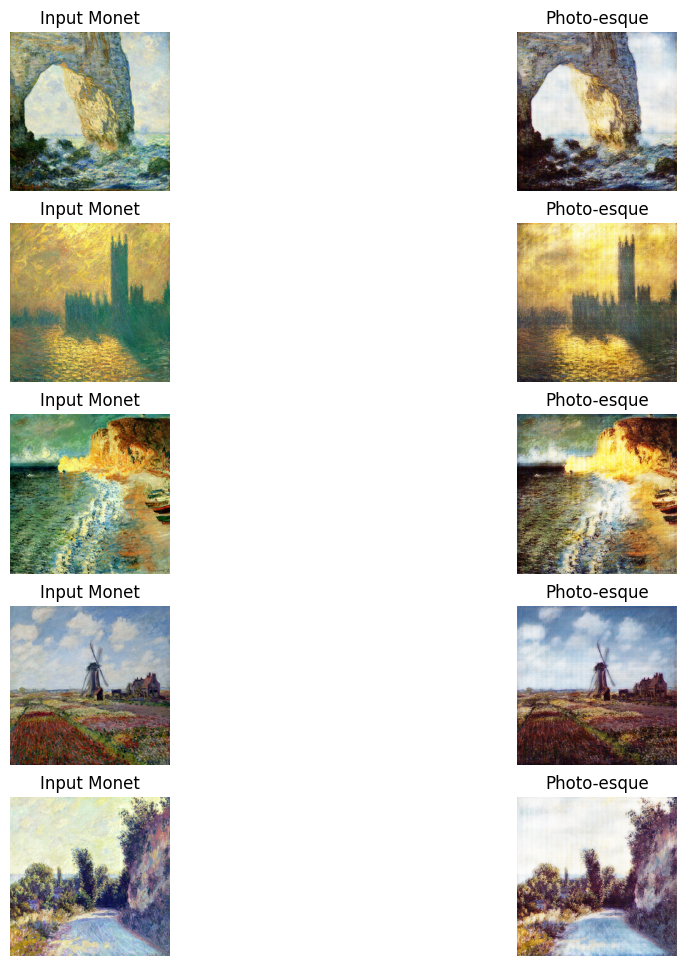

In [9]:
_, ax = plt.subplots(5, 2, figsize=(12, 12))
for i, img in enumerate(monet_ds.take(5)):
    prediction = photo_generator_batch_norm_PReLU_filter_size_6(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Monet")
    ax[i, 1].set_title("Photo-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

In [12]:
import PIL

In [13]:
i = 1
for img in photo_ds:
    prediction = monet_generator_batch_norm_PReLU_filter_size_6(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save("C:/Users/Johns/Desktop/Data/monet/images/" + str(i) + ".jpg")
    i += 1

In [14]:
import shutil
shutil.make_archive("C:/Users/Johns/Desktop/Data/monet", 'zip', "C:/Users/Johns/Desktop/Data/monet/images")

'C:\\Users\\Johns\\Desktop\\Data\\monet.zip'